In [1]:
# !pip install --quiet mediapy
# !pip install robosuite==1.4

In [2]:
from experiments.robot.robot_utils import (
    DATE_TIME,
    get_action,
    get_model,
    invert_gripper_action,
    normalize_gripper_action,
    set_seed_everywhere,
)
from experiments.robot.openvla_utils import get_processor

from experiments.robot.libero.libero_utils import (
    get_libero_image,
    quat2axisangle,
)

2025-01-03 11:00:42.057727: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-01-03 11:00:42.057769: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-01-03 11:00:42.058749: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-01-03 11:00:42.063358: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-01-03 11:00:42.701124: W tensorflow/compiler/tf2

01/03 [11:00:56] WARNING  | >> No private macro file found!                                           ]8;id=654976;file:///home/khw/anaconda3/envs/openvla2/lib/python3.10/site-packages/robosuite/__init__.py\__init__.py]8;;\:]8;id=625342;file:///home/khw/anaconda3/envs/openvla2/lib/python3.10/site-packages/robosuite/__init__.py#7\7]8;;\

[robosuite WARNING] It is recommended to use a private macro file (__init__.py:8)


                 WARNING  | >> It is recommended to use a private macro file                          ]8;id=22868;file:///home/khw/anaconda3/envs/openvla2/lib/python3.10/site-packages/robosuite/__init__.py\__init__.py]8;;\:]8;id=950017;file:///home/khw/anaconda3/envs/openvla2/lib/python3.10/site-packages/robosuite/__init__.py#8\8]8;;\

[robosuite WARNING] To setup, run: python /home/khw/anaconda3/envs/openvla2/lib/python3.10/site-packages/robosuite/scripts/setup_macros.py (__init__.py:9)


                 WARNING  | >> To setup, run: python                                                  ]8;id=164483;file:///home/khw/anaconda3/envs/openvla2/lib/python3.10/site-packages/robosuite/__init__.py\__init__.py]8;;\:]8;id=271872;file:///home/khw/anaconda3/envs/openvla2/lib/python3.10/site-packages/robosuite/__init__.py#9\9]8;;\
                          /home/khw/anaconda3/envs/openvla2/lib/python3.10/site-packages/robosuite/sc              
                          ripts/setup_macros.py                                                                    

                 INFO     | >> No OpenGL_accelerate module loaded: No module named          ]8;id=996102;file:///home/khw/anaconda3/envs/openvla2/lib/python3.10/site-packages/OpenGL/acceleratesupport.py\acceleratesupport.py]8;;\:]8;id=314588;file:///home/khw/anaconda3/envs/openvla2/lib/python3.10/site-packages/OpenGL/acceleratesupport.py#23\23]8;;\
                          'OpenGL_accelerate'                                                                      

In [3]:
from typing import Optional, Union
from pathlib import Path
import os 
import mediapy
import tqdm
import numpy as np
import cv2

In [4]:
class GenerateConfig:
    # fmt: off

    #################################################################################################################
    # Model-specific parameters
    #################################################################################################################
    model_family: str = "openvla"                    # Model family
    pretrained_checkpoint: Union[str, Path] = ""     # Pretrained checkpoint path
    load_in_8bit: bool = False                       # (For OpenVLA only) Load with 8-bit quantization
    load_in_4bit: bool = False                       # (For OpenVLA only) Load with 4-bit quantization

    center_crop: bool = True                         # Center crop? (if trained w/ random crop image aug)

    #################################################################################################################
    # LIBERO environment-specific parameters
    #################################################################################################################
    task_suite_name: str = "libero_spatial"          # Task suite. Options: libero_spatial, libero_object, libero_goal, libero_10, libero_90
    num_steps_wait: int = 10                         # Number of steps to wait for objects to stabilize in sim
    num_trials_per_task: int = 50                    # Number of rollouts per task

    #################################################################################################################
    # Utils
    #################################################################################################################
    run_id_note: Optional[str] = None                # Extra note to add in run ID for logging
    local_log_dir: str = "./experiments/logs"        # Local directory for eval logs

    use_wandb: bool = False                          # Whether to also log results in Weights & Biases
    wandb_project: str = "YOUR_WANDB_PROJECT"        # Name of W&B project to log to (use default!)
    wandb_entity: str = "YOUR_WANDB_ENTITY"          # Name of entity to log under

    seed: int = 7                                    # Random Seed (for reproducibility)

    # fmt: on

In [5]:
cfg = GenerateConfig()

In [6]:
# ["libero_spatial", "libero_object", "libero_goal", "libero_10"]
cfg.task_suite_name = "libero_10" # can also choose libero_spatial, libero_object, etc.
cfg.pretrained_checkpoint = f"openvla/openvla-7b-finetuned-libero-10"
cfg.load_in_4bit = True
resize_size = 512

In [7]:
# [OpenVLA] Set action un-normalization key
cfg.unnorm_key = cfg.task_suite_name

In [8]:
# Set random seed
set_seed_everywhere(cfg.seed)

In [9]:
model = get_model(cfg)

[*] Instantiating Pretrained VLA model
[*] Loading in BF16 with Flash-Attention Enabled


<frozen importlib._bootstrap>:283: DeprecationWarning: the load_module() method is deprecated and slated for removal in Python 3.12; use exec_module() instead
Loading checkpoint shards: 100%|██████████| 4/4 [00:03<00:00,  1.08it/s]


You can ignore this if you are loading the base VLA (i.e. not fine-tuned) checkpoint.Otherwise, you may run into errors when trying to call `predict_action()` due to an absent `unnorm_key`.
Loaded model: <class 'transformers_modules.openvla.openvla-7b.31f090d05236101ebfc381b61c674dd4746d4ce0.modeling_prismatic.OpenVLAForActionPrediction'>


In [10]:
# [OpenVLA] Check that the model contains the action un-normalization key
if cfg.model_family == "openvla":
    # In some cases, the key must be manually modified (e.g. after training on a modified version of the dataset
    # with the suffix "_no_noops" in the dataset name)
    if cfg.unnorm_key not in model.norm_stats and f"{cfg.unnorm_key}_no_noops" in model.norm_stats:
        cfg.unnorm_key = f"{cfg.unnorm_key}_no_noops"

In [11]:
cfg.unnorm_key

'libero_10'

In [12]:
# [OpenVLA] Get Hugging Face processor
processor = None
if cfg.model_family == "openvla":
    processor = get_processor(cfg)

In [13]:
from libero.libero import benchmark
from libero.libero.envs import OffScreenRenderEnv
from libero.libero import get_libero_path

In [14]:
def get_libero_env(task, resolution=256):
    """Initializes and returns the LIBERO environment, along with the task description."""
    task_description = task.language
    task_bddl_file = os.path.join(get_libero_path("bddl_files"), task.problem_folder, task.bddl_file)
    env_args = {"bddl_file_name": task_bddl_file, "camera_heights": resolution, "camera_widths": resolution}
    env = OffScreenRenderEnv(**env_args)
    env.seed(0)  # IMPORTANT: seed seems to affect object positions even when using fixed initial state
    return env, task_description

In [15]:
# Initialize LIBERO task suite
benchmark_dict = benchmark.get_benchmark_dict()
task_suite = benchmark_dict[cfg.task_suite_name]()
num_tasks_in_suite = task_suite.n_tasks
print(f"Task suite: {cfg.task_suite_name}")

[info] using task orders [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
Task suite: libero_10


In [16]:
task_id = 6

In [17]:
# Get task
task = task_suite.get_task(task_id)

# Get default LIBERO initial states
initial_states = task_suite.get_task_init_states(task_id)

# Initialize LIBERO environment and task description
env, task_description = get_libero_env(task, resolution=256)

print('task_description:')
print(task_description)


[Warning]: datasets path /home/khw/VLA/LIBERO/LIBERO/libero/libero/../datasets does not exist!
[Warning]: datasets path /home/khw/VLA/LIBERO/LIBERO/libero/libero/../datasets does not exist!
task_description:
put the white mug on the plate and put the chocolate pudding to the right of the plate


In [18]:
import imageio

def save_rollout_video(rollout_images, idx):
    """Saves an MP4 replay of an episode."""
    mp4_path = f"./demo_task_{idx}.mp4"
    video_writer = imageio.get_writer(mp4_path, fps=30)
    for img in rollout_images:
        video_writer.append_data(img)
    video_writer.close()
    print(f"Saved rollout MP4 at path {mp4_path}")
    return mp4_path

In [31]:


def test(task_successes, episode_idx, instruction):

    # Reset environment
    env.reset()

    # Set initial states
    obs = env.set_init_state(initial_states[episode_idx])

    # Setup
    t = 0
    replay_images = []
    if cfg.task_suite_name == "libero_spatial":
        max_steps = 400*2  # longest training demo has 193 steps
    elif cfg.task_suite_name == "libero_object":
        max_steps = 400*2  # longest training demo has 254 steps
    elif cfg.task_suite_name == "libero_goal":
        max_steps = 400*2  # longest training demo has 270 steps
    elif cfg.task_suite_name == "libero_10":
        max_steps = 520*2  # longest training demo has 505 steps
    elif cfg.task_suite_name == "libero_90":
        max_steps = 400*2  # longest training demo has 373 steps

    print(f"Starting task : {task}...")
    while t < max_steps + cfg.num_steps_wait:
        try:
            # IMPORTANT: Do nothing for the first few timesteps because the simulator drops objects
            # and we need to wait for them to fall
            if t < cfg.num_steps_wait:
                get_libero_dummy_action = [0, 0, 0, 0, 0, 0, -1]
                obs, reward, done, info = env.step(get_libero_dummy_action)
                t += 1
                continue

            # Get preprocessed image
            img = get_libero_image(obs, resize_size)

            # Save preprocessed image for replay video
            replay_images.append(img)
            
            cv2.imshow("Real-time View", cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

            # 'q'를 누르면 종료
            if cv2.waitKey(1) & 0xFF == ord('q'):
                print("Visualization stopped by user.")
                break

            # Prepare observations dict
            # Note: OpenVLA does not take proprio state as input
            observation = {
                "full_image": img,
                "state": np.concatenate(
                    (obs["robot0_eef_pos"], quat2axisangle(obs["robot0_eef_quat"]), obs["robot0_gripper_qpos"])
                ),
            }

            # Query model to get action
            action = get_action(
                cfg,
                model,
                observation,
                instruction,
                processor=processor,
            )

            # Normalize gripper action [0,1] -> [-1,+1] because the environment expects the latter
            action = normalize_gripper_action(action, binarize=True)

            # [OpenVLA] The dataloader flips the sign of the gripper action to align with other datasets
            # (0 = close, 1 = open), so flip it back (-1 = open, +1 = close) before executing the action
            if cfg.model_family == "openvla":
                action = invert_gripper_action(action)

            # Execute action in environment
            obs, reward, done, info = env.step(action.tolist())
            if done:
                task_successes += 1
                print('Success', task_successes)
                break
            t += 1

        except Exception as e:
            print(f"Caught exception: {e}")
            break

    # OpenCV 창 닫기
    cv2.destroyAllWindows()
    
    return replay_images
    
    
print(f"\nTask: {task_description}")

task_successes = 0
episode_idx = 0
instruction = task_description

replay_images = test(task_successes, episode_idx, instruction)



Task: put the white mug on the plate and put the chocolate pudding to the right of the plate
Starting task : Task(name='LIVING_ROOM_SCENE6_put_the_white_mug_on_the_plate_and_put_the_chocolate_pudding_to_the_right_of_the_plate', language='put the white mug on the plate and put the chocolate pudding to the right of the plate', problem='Libero', problem_folder='libero_10', bddl_file='LIVING_ROOM_SCENE6_put_the_white_mug_on_the_plate_and_put_the_chocolate_pudding_to_the_right_of_the_plate.bddl', init_states_file='LIVING_ROOM_SCENE6_put_the_white_mug_on_the_plate_and_put_the_chocolate_pudding_to_the_right_of_the_plate.pruned_init')...
Success 1


""

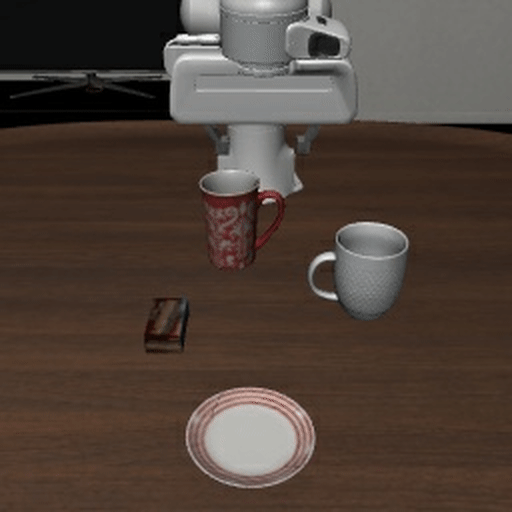

In [20]:
mediapy.show_video(replay_images, fps=15, codec='gif')

In [ ]:
mediapy.write_image('/tmp/checkerboard.gif', replay_images)

In [21]:
# Save a replay video of the episode
save_rollout_video(replay_images, task_description)

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


Saved rollout MP4 at path ./demo_task_put the white mug on the plate and put the chocolate pudding to the right of the plate.mp4


'./demo_task_put the white mug on the plate and put the chocolate pudding to the right of the plate.mp4'

## 이번에는 instruction을 내 마음대로 바꾸서 확인해보자. 

이번에는 초콜렛 푸딩을 접시 위에 올려 두라고 해본다.

In [32]:

task_successes = 0
episode_idx = 0
instruction = "put the chocolate pudding on the plate"

replay_images = test(task_successes, episode_idx, instruction)

Starting task : Task(name='LIVING_ROOM_SCENE6_put_the_white_mug_on_the_plate_and_put_the_chocolate_pudding_to_the_right_of_the_plate', language='put the white mug on the plate and put the chocolate pudding to the right of the plate', problem='Libero', problem_folder='libero_10', bddl_file='LIVING_ROOM_SCENE6_put_the_white_mug_on_the_plate_and_put_the_chocolate_pudding_to_the_right_of_the_plate.bddl', init_states_file='LIVING_ROOM_SCENE6_put_the_white_mug_on_the_plate_and_put_the_chocolate_pudding_to_the_right_of_the_plate.pruned_init')...
Caught exception: executing action in terminated episode


In [ ]:
mediapy.show_video(replay_images, fps=15, codec='gif')

In [36]:

task_successes = 0
episode_idx = 0
instruction = "put the chocolate pudding on the white mug"

replay_images = test(task_successes, episode_idx, instruction)


Starting task : Task(name='LIVING_ROOM_SCENE6_put_the_white_mug_on_the_plate_and_put_the_chocolate_pudding_to_the_right_of_the_plate', language='put the white mug on the plate and put the chocolate pudding to the right of the plate', problem='Libero', problem_folder='libero_10', bddl_file='LIVING_ROOM_SCENE6_put_the_white_mug_on_the_plate_and_put_the_chocolate_pudding_to_the_right_of_the_plate.bddl', init_states_file='LIVING_ROOM_SCENE6_put_the_white_mug_on_the_plate_and_put_the_chocolate_pudding_to_the_right_of_the_plate.pruned_init')...
Caught exception: executing action in terminated episode


In [ ]:
mediapy.show_video(replay_images, fps=15, codec='gif')

결론: 아무래도 4비트 양자화는 좋은 결과를 기대하기 어려운것 같다. 